# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


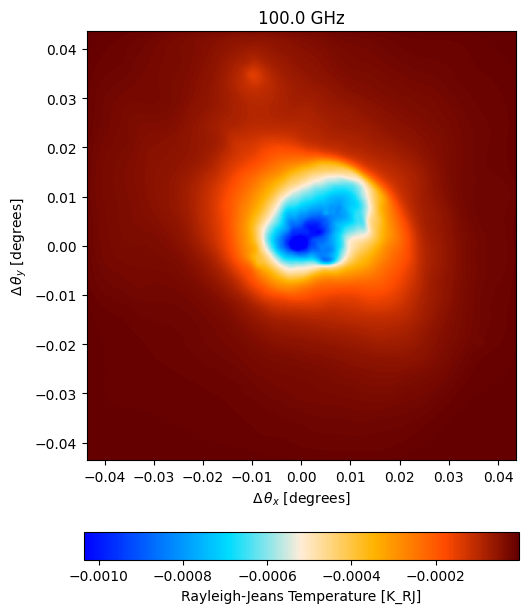

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

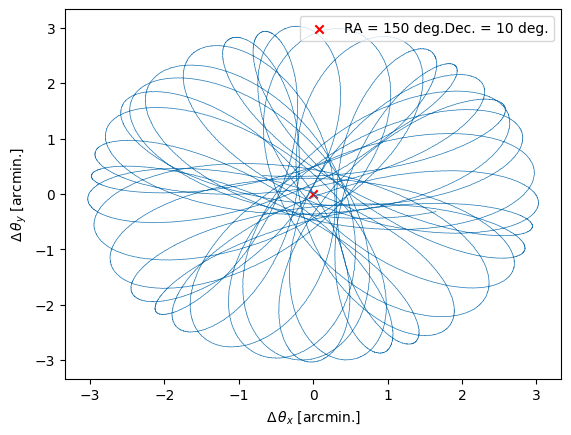

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                    # duration=60,
                    #   duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-25 13:04:32.271 INFO: Initialized base in 1560 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]
2024-10-25 13:04:38.076 INFO: Initialized atmosphere in 5793 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


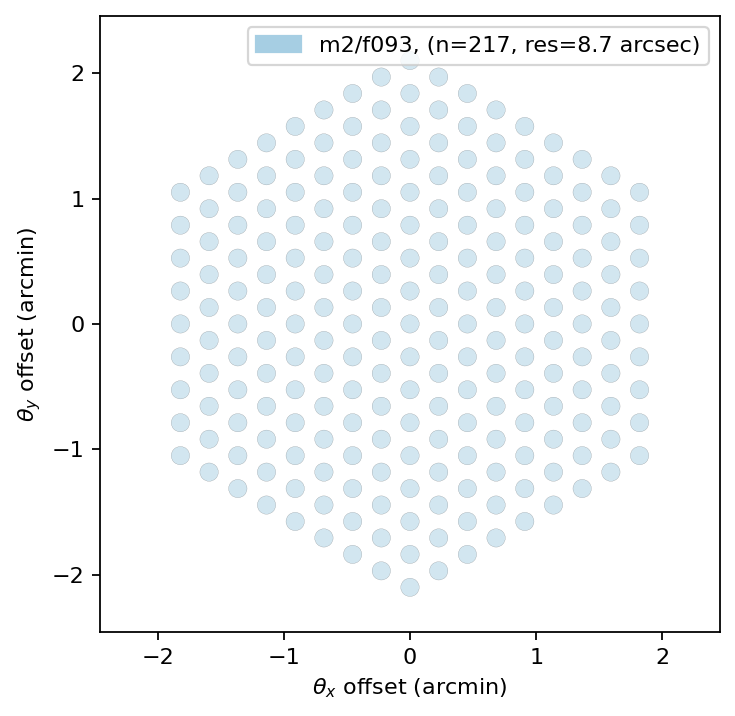

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.96472127e-04, -1.92266075e-04, -1.89364799e-04, ...,
         4.73544422e-04,  4.75764538e-04,  4.80074926e-04],
       [-2.45591243e-04, -2.41385366e-04, -2.38484199e-04, ...,
         4.28197788e-04,  4.30417830e-04,  4.34727947e-04],
       [-1.21281943e-04, -1.17075931e-04, -1.14174679e-04, ...,
         5.49422419e-04,  5.51642525e-04,  5.55952875e-04],
       ...,
       [ 1.21290630e-04,  1.25498132e-04,  1.28400302e-04, ...,
         7.60439445e-04,  7.62660165e-04,  7.66972760e-04],
       [-4.05040667e-04, -4.00832884e-04, -3.97930540e-04, ...,
         2.29293459e-04,  2.31514251e-04,  2.35827111e-04],
       [-7.45851477e-04, -7.41645537e-04, -7.38744329e-04, ...,
        -7.24168428e-05, -7.01968123e-05, -6.58867405e-05]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.59s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


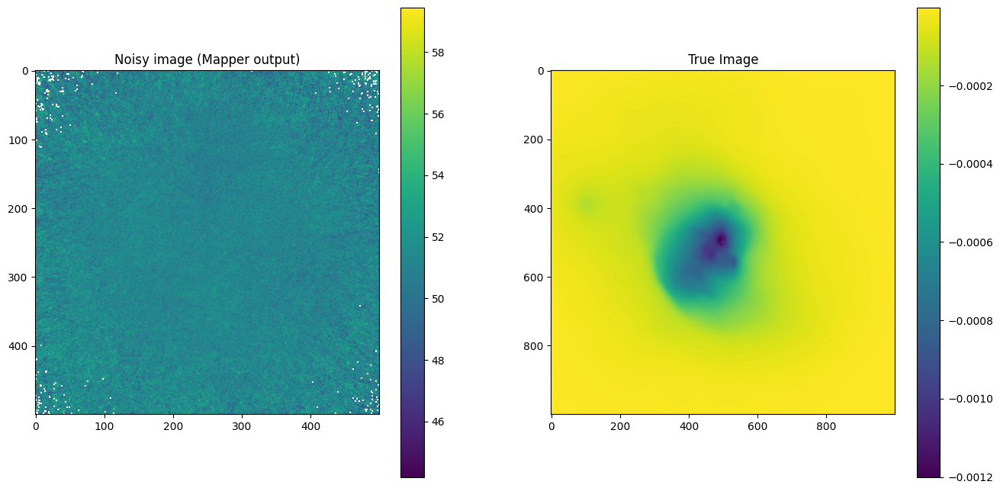

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0, 0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-25 13:04:52.104 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-25 13:04:52.106 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

MARKER: pre-TRJ
sim_truthmap.shape (1, 1, 1000, 1000)
TRJ shape: (64, 1, 1000, 1000)
TRJ shape after reshape: (1, 64, 1000, 1000)
nu_passband shape: (64,)
construct_beam_filter inputs: 4.241302394573353e-05 1.5208799101878587e-06
F shape: (27, 27)
u, s, v shapes: (27, 27) (27,) (27, 27)
data.shape (1, 1000, 1000)
filtered_power_map shape: (1, 1000, 1000)


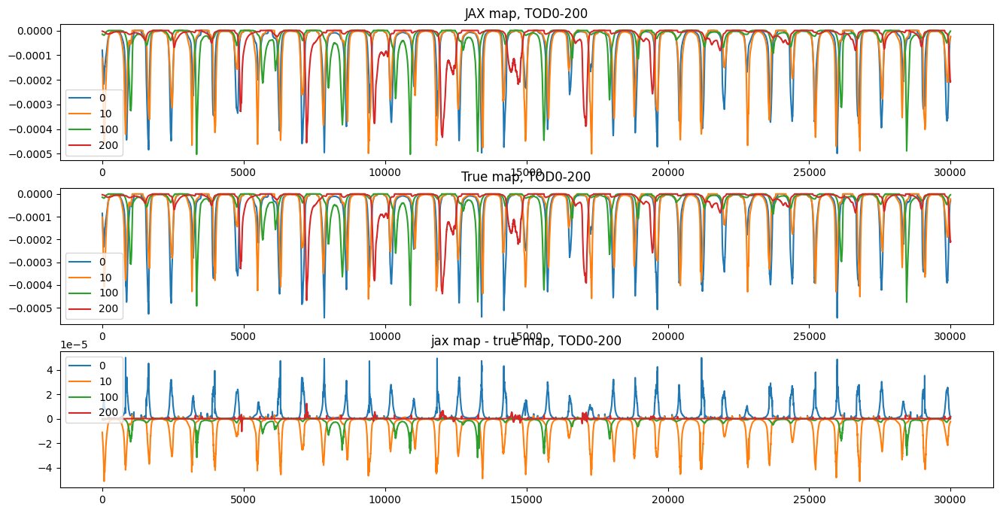

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.get_field('map').compute())
    im1 = axes[1].plot(tods_map[i], label=i)

    im2 = axes[2].plot(jax_tods_map[i] - tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX map, TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True map, TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'jax map - true map, TOD0-{i}')
axes[2].legend()

plt.show()

In [ ]:
assert False

AssertionError: 

# Prepare noised input TODs:

Noise stddev: 0.000251595090607786


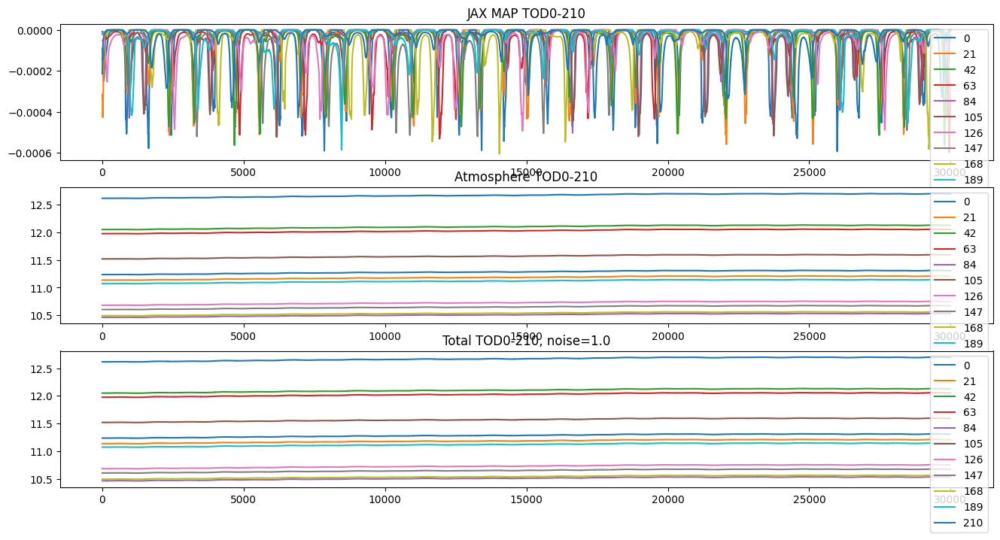

In [8]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
# n = 1
# n = 10
# n = 100
n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.get_field('atmosphere')
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.get_field('noise')*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n]) 
# # noised_jax_tod[:n] = np.float64(jax_tods_atmos[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.get_field('noise')*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.get_field('noise').compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

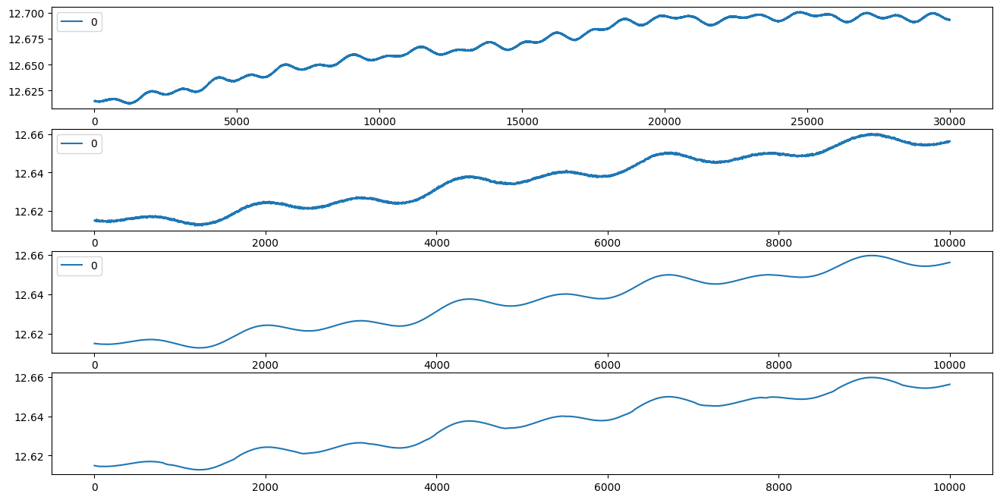

In [9]:
fig, axes = plt.subplots(4, 1, figsize=(16, 8))
for i in range(1):
    axes[0].plot(jax_tods_atmos[i] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[i], label=i)
    axes[1].plot( (jax_tods_atmos[i] + np.float64(tod_truthmap.get_field('noise')*noiselevel)[i])[:10000], label=i)
    axes[2].plot( (jax_tods_atmos[i] )[:10000], label=i)
    axes[3].plot( (jax_tods_atmos[i] + jax_tods_map[i] )[:10000], label=i)
    # axes[3].plot( (jax_tods_map[i] )[:10000], label=i) 

axes[0].legend()
axes[1].legend()
axes[2].legend()

# Next, initialise nifty prior model

Start with the atmosphere TOD model. For this, we need to re-write the CorrelatedFieldMaker:

In [10]:
import jax

import jax.numpy as jnp
import numpy as np
import nifty8.re as jft
import matplotlib.pyplot as plt

from functools import partial
from nifty8.re.correlated_field import Model, RegularCartesianGrid, hartley, HEALPixGrid, get_sht, ShapeWithDtype, random_like

key = jax.random.PRNGKey(42)

In [11]:
class CFM(jft.CorrelatedFieldMaker):
    def __init__(self, prefix):
        super().__init__(prefix)

    def finalize(self, n_fields: int = 0) -> Model:
        """Finishes off the model construction process and returns the
        constructed operator.
        """
        harmonic_transforms = []
        excitation_shape = ()
        for sgrid in self._target_grids:
            sub_shp = None
            sub_shp = sgrid.harmonic_grid.shape
            excitation_shape += sub_shp
            n = len(excitation_shape)
            harmonic_dvol = 1.0 / sgrid.total_volume
            if isinstance(sgrid, RegularCartesianGrid):
                axes = tuple(range(n - len(sub_shp), n))
                # TODO: Generalize to complex
                trafo = partial(hartley, axes=axes)
            elif isinstance(sgrid, HEALPixGrid):
                axis = len(excitation_shape) - 1
                trafo = get_sht(
                    nside=sgrid.nside,
                    axis=axis,
                    lmax=sgrid.harmonic_grid.lmax,
                    mmax=sgrid.harmonic_grid.mmax,
                    nthreads=1,
                )
            harmonic_transforms.append((harmonic_dvol, trafo))

        # Register the parameters for the excitations in harmonic space
        # TODO: actually account for the dtype here
        pfx = self._prefix + "xi"
        if n_fields > 0:
            xi_shape = (n_fields,) + excitation_shape
        else:
            xi_shape = excitation_shape
        self._parameter_tree[pfx] = ShapeWithDtype(xi_shape)

        def outer_harmonic_transform(p):
            harmonic_dvol, ht = harmonic_transforms[0]
            outer = harmonic_dvol * ht(p)
            for harmonic_dvol, ht in harmonic_transforms[1:]:
                outer = harmonic_dvol * ht(outer)
            return outer

        def _mk_expanded_amp(amp, sub_dom):  # Avoid late binding
            def expanded_amp(p):
                return amp(p)[sub_dom.harmonic_grid.power_distributor]

            return expanded_amp

        expanded_amplitudes = []
        namps = self.get_normalized_amplitudes()
        for amp, sgrid in zip(namps, self._target_grids):
            expanded_amplitudes.append(_mk_expanded_amp(amp, sgrid))

        def outer_amplitude(p):
            outer = expanded_amplitudes[0](p)
            for amp in expanded_amplitudes[1:]:
                # NOTE, the order is important here and must match with the
                # excitations
                # TODO, use functions instead and utilize numpy's casting
                outer = jnp.tensordot(outer, amp(p), axes=0)
            return outer

        def correlated_field(p):
            ea = outer_amplitude(p)
            cf_h = self.azm(p) * ea * p[self._prefix + "xi"]
            return self._offset_mean + outer_harmonic_transform(cf_h)
        
        p_dct = {k: 0 if 'xi' in k else None for k in self._parameter_tree}
        cfm_vmap = jax.vmap(correlated_field, in_axes=(p_dct,))

        init = {
            k: partial(random_like, primals=v) for k, v in self._parameter_tree.items()
        }
        cf = Model(cfm_vmap, domain=self._parameter_tree.copy(), init=init)
        cf.normalized_amplitudes = namps
        cf.target_grids = tuple(self._target_grids)
        return cf

In [12]:
# padding_atmos = 2000
# padding_atmos = 5000
padding_atmos = 10000
dims_atmos = ( (jax_tods_atmos.shape[1] + padding_atmos), )
# dims_atmos = ( (jax_tods_atmos.shape[1] - 200 + padding_atmos), )

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.002, 0.001))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0002, 0.0001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.003), 
    # fluctuations=(0.001, 0.0005),
    fluctuations=(0.002, 0.001),
    # loglogavgslope=(-3, 0.5), 
    # loglogavgslope=(-2, 0.5), 
    loglogavgslope=(-2.5, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
# Custom CFM:
cfm_tod = CFM("combcf ")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
gp_tod = cfm_tod.finalize(n)
gp_tod

# Old: default CFM:
# cfm_tod = jft.CorrelatedFieldMaker("")
# cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
# cfm_tod.add_fluctuations(
#     dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
# )
# # init params for each TOD:
# gps_tods = []
# for i in range(n):
#     cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
#     # cfmi.set_amplitude_total_offset(**cf_zm_tod)
#     cfmi._azm = cfm_tod._azm
#     cfmi._offset_mean = cfm_tod._offset_mean
#     cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

#     cfmi._fluctuations.append(cfm_tod._fluctuations[0])
#     cfmi._target_grids.append(cfm_tod._target_grids[0])
#     cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
#     gps_tods.append(cfmi.finalize())
# gps_tods

Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1488def24180>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1488cc33aac0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1488cc33aac0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1488cc33aac0>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function random_like at 0x1

## Now for the map model:

In [13]:
# padding_map = 100
# dims_map = (1000 + padding_map, 1000 + padding_map)
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(1e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    # fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(4.5e-5, 2e-5),
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

# Define offset NormalPrior:

deviation_truth mean: -4.503587944625867e-15
deviation_truth std: 0.5508811849675002
deviation mean: 9.030821354424554e-15
deviation std: 0.5508804025392479


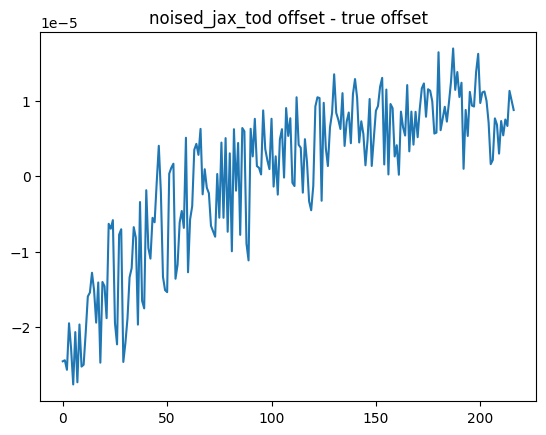

In [14]:
# True atmos deviations
deviation_truth = (jax_tods_atmos - jax_tods_atmos.mean()).compute()
# Deviations from noised tods:
deviation = noised_jax_tod - noised_jax_tod.mean()

print("deviation_truth mean:", deviation_truth.mean())
print("deviation_truth std:", deviation_truth.std())
print("deviation mean:", deviation.mean())
print("deviation std:", deviation.std())

offset_tod_truth = jnp.float64(deviation_truth.mean(axis=1)[:n])
offset_tod = jnp.float64(deviation.mean(axis=1)[:n])
# print("offset for n dets:", offset_tod)

plt.plot(offset_tod - offset_tod_truth)
plt.title('noised_jax_tod offset - true offset')
plt.show()

In [ ]:
# offset_dict = dict(mean = 0.0, std = 0.6, shape=(n,))
# offset_tod = jft.NormalPrior(**offset_dict, name='offset')

# offset_tod

# OLD Signal model:

In [16]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods, gp_map):
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         # Only add first n atmosphere tods, otherwise use map
#         modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Using CFM - combined

In [17]:
class Signal_TOD(jft.Model):
    def __init__(self, gp_tod, offset_tod, gp_map):
        self.gp_tod = gp_tod
        self.gp_map = gp_map
        self.offset_tod = offset_tod

        # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
        #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
        super().__init__(init = self.gp_tod.init | self.gp_map.init,
                        domain = self.gp_tod.domain | self.gp_map.domain )


    def __call__(self, x):
        x_tod = {k: x[k] for k in x if 'comb' in k}
        res_tods = self.gp_tod(x_tod)
        # res_tods = self.gp_tod(x['tod'])

        # res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] + self.offset_tod(x)[:, jax.numpy.newaxis]
        res_tods_offset = res_tods[:, padding_atmos//2:-padding_atmos//2] + self.offset_tod[:, jax.numpy.newaxis]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
        # Only add first n atmosphere tods, otherwise use map
        # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])
        modified_res_map = res_map.at[:n, :].add(res_tods_offset)

        return modified_res_map
    
signal_response_tod = Signal_TOD(gp_tod, offset_tod, gp_map)

# map-only:

In [18]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         self.gp_map = gp_map

#         # super().__init__(init = self.gp_tod.init | self.gp_map.init | self.offset_tod.init,
#         #                  domain = self.gp_tod.domain | self.gp_map.domain | self.offset_tod.domain)
#         super().__init__(init = self.gp_map.init,
#                         domain = self.gp_map.domain )


#     def __call__(self, x):
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         return res_map
    
# signal_response_tod = Signal_TOD(gp_map)

# CFM - TOD

In [19]:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_tod):
#         self.gp_tod = gp_tod
#         super().__init__(init = self.gp_tod.init, domain = self.gp_tod.domain )
    
#     def __call__(self, x):
#         x_tod = {k: x[k] for k in x if 'map' not in k}
#         res_tods = self.gp_tod(x_tod)
#         # res_tods = self.gp_tod(x)

#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

# signal_response_tod = Signal_TOD(gp_tod)

In [20]:
# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
print(noised_jax_tod.shape)
# truth = noised_jax_tod[:, 100:-100]
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


In [21]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x1488cc33aac0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x148

# Draw Prior sample

(217, 30000)


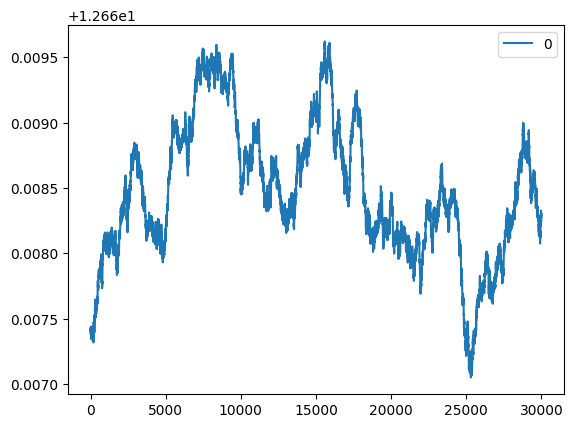

In [22]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [23]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:1.710250e+04 ➽:9.680006e+02
M: Iteration 1 ⛰:+9.264417e+09 Δ⛰:2.140590e+10
M: →:0.25 ↺:False #∇²:12 |↘|:2.325271e+03 ➽:9.680006e+02
M: Iteration 2 ⛰:+5.013757e+09 Δ⛰:4.250659e+09
M: →:1.0 ↺:False #∇²:18 |↘|:1.262344e+03 ➽:9.680006e+02
M: Iteration 3 ⛰:+1.007903e+09 Δ⛰:4.005854e+09
M: →:1.0 ↺:False #∇²:24 |↘|:6.302170e+02 ➽:9.680006e+02
M: Iteration 4 ⛰:+3.091146e+08 Δ⛰:6.987886e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+3.0911e+08
OPTIMIZE_KL: #(KL minimization steps) 4
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 9.3e+01±     0.0, avg:    -0.49±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²: 2.5e+01±     0.0, avg:     +5.0±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²: 1.8e+02±     0.0, avg: -1.3e+01±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±   

In [24]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(4.98366906, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-13.46555494, dtype=float64),
	 'cfmapxi': Array([[-1.03604596,  9.92881823,  2.68294947, ..., -1.27639799,
	        -0.50182567, -8.17132112],
	       [-3.20476269,  1.66004928,  0.93942279, ..., -0.16123881,
	         0.1244689 ,  0.98434994],
	       [ 0.07820625,  1.05047781, -1.14273605, ...,  1.24869023,
	         0.5407987 ,  1.43297846],
	       ...,
	       [-1.38583248, -0.3635561 , -1.45311928, ..., -0.63359915,
	         1.67985639, -1.22803613],
	       [ 2.61036882,  0.44264946, -0.82654609, ...,  0.56781835,
	         0.35566742,  1.38827034],
	       [ 5.76054591, -2.03443867, -1.39142432, ...,  0.6587093 ,
	        -0.12863095,  0.75903056]], dtype=float64),
	 'cfmapzeromode': Array(-0.40626891, dtype=float64),
	 'combcf tod fluctuations': Array(0.33997873, dtype=float64),
	 'combcf tod loglogavgslope': Array(0.87018975, dtype=float64),
	 'combcf xi': Array([[ -2.95840

In [26]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    # # NEW model:
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['combcf tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['combcf tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['combcf zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")
    # OLD model:
    # print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    # print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    # print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # offset per detector:
    # offset_results = jft.NormalPrior(**offset_dict)(samples.pos['offset'])
    # print(f"\toffset: ({offset_results.mean()}, {offset_results.std()}), {offset_dict['mean']}, {offset_dict['std']}")
    # # residual offset:
    # offset_residuals = offset_results - jnp.float64(deviation.mean(axis=1)[:n].compute())
    # print(f"\toffset residuals: ({offset_residuals.mean()}, {offset_residuals.std()})")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0021004987211133705, 0.002, 0.001
	loglogvarslope: -2.064905126692969, -2.5, 0.5
	zeromode std (LogNormal): 0.00030080894927231793, 0.0002, 0.0001
map:
	fluctuations: 0.00034119716422928475, 4.5e-05, 2e-05
	loglogvarslope: -9.232777469796426, -2.5, 0.5
	zeromode std (LogNormal): 4.157148037162045e-10, 1e-08, 1e-07


(217, 30000)


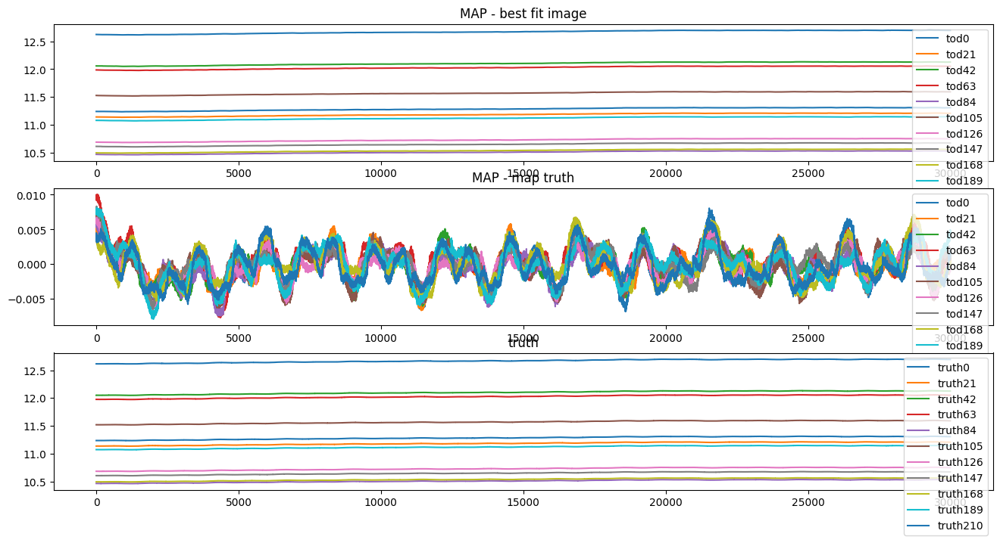

In [27]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in range(0, n, n//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

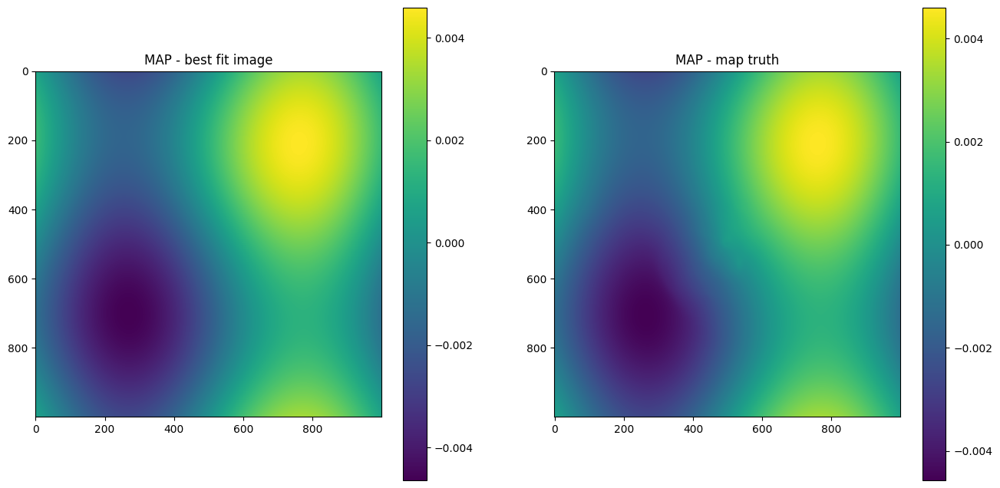

In [28]:
# plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [29]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.8352e+07 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+1.1276e+07 Δ⛰:7.0760e+06 ➽:9.6800e+01
SL: Iteration 2 ⛰:+3.8133e+06 Δ⛰:7.4627e+06 ➽:9.6800e+01
SL: Iteration 3 ⛰:-4.0767e+05 Δ⛰:4.2209e+06 ➽:9.6800e+01
SL: Iteration 4 ⛰:-1.7694e+06 Δ⛰:1.3618e+06 ➽:9.6800e+01
SL: Iteration 5 ⛰:-2.8461e+06 Δ⛰:1.0767e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:-3.9009e+06 Δ⛰:1.0548e+06 ➽:9.6800e+01
SL: Iteration 7 ⛰:-4.1399e+06 Δ⛰:2.3903e+05 ➽:9.6800e+01
SL: Iteration 8 ⛰:-4.2629e+06 Δ⛰:1.2299e+05 ➽:9.6800e+01
SL: Iteration 9 ⛰:-4.3561e+06 Δ⛰:9.3236e+04 ➽:9.6800e+01
SL: Iteration 10 ⛰:-4.4119e+06 Δ⛰:5.5797e+04 ➽:9.6800e+01
SL: Iteration 11 ⛰:-4.5098e+06 Δ⛰:9.7872e+04 ➽:9.6800e+01
SL: Iteration 12 ⛰:-4.5471e+06 Δ⛰:3.7313e+04 ➽:9.6800e+01
SL: Iteration 13 ⛰:-4.5814e+06 Δ⛰:3.4243e+04 ➽:9.6800e+01
SL: Iteration 14 ⛰:-4.5975e+06 Δ⛰:1.6087e+04 ➽:9.6800e+01
SL: Iteration 15 ⛰:-4.6156e+06 Δ⛰:1.8163e+04 ➽:9.6800e+01
SL: Iteration 16 ⛰:-4.6235e+06 Δ⛰:7.8280e+03 ➽:9.6800e+01
SL: 

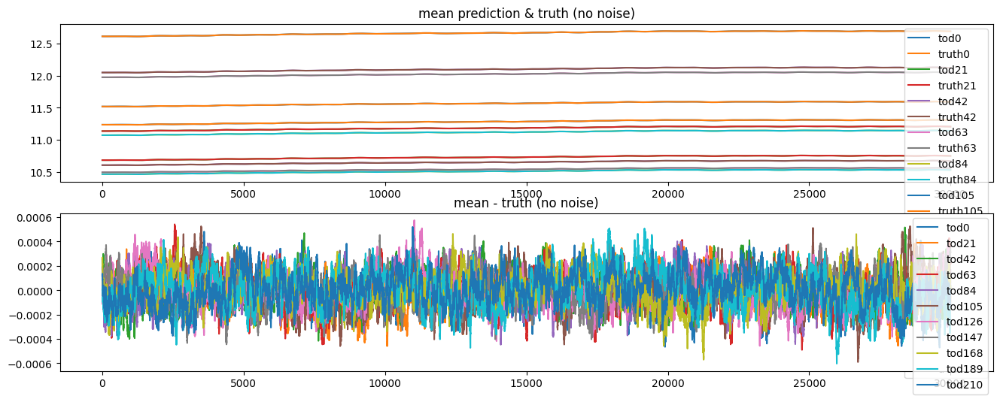

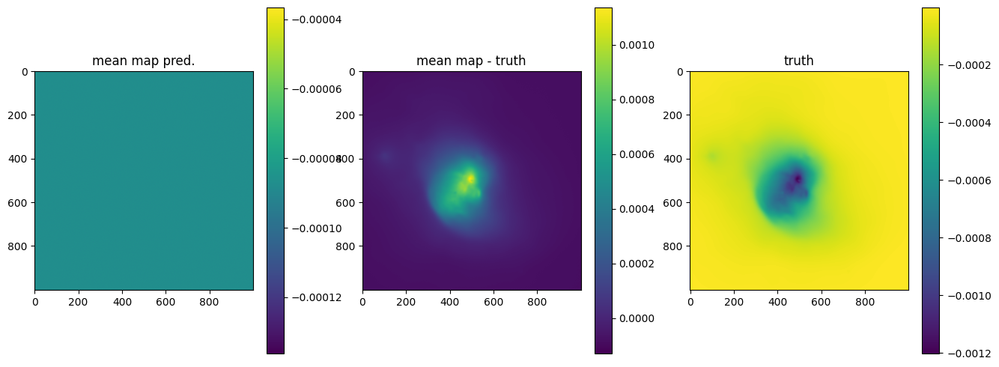

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+2.2454e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+5.5567e+08 Δ⛰:1.6897e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+7.4686e+07 Δ⛰:4.8099e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.6856e+07 Δ⛰:1.7830e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+1.4910e+07 Δ⛰:4.1946e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+7.5681e+06 Δ⛰:7.3418e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+7.5232e+06 Δ⛰:4.4933e+04 ➽:9.6800e+01
SL: Iteration 7 ⛰:+2.9629e+06 Δ⛰:4.5603e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+2.9295e+06 Δ⛰:3.3357e+04 ➽:9.6800e+01
SL: Iteration 9 ⛰:+1.3472e+05 Δ⛰:2.7948e+06 ➽:9.6800e+01
SL: Iteration 10 ⛰:+1.3463e+05 Δ⛰:9.2834e+01 ➽:9.6800e+01
SL: Iteration 0 ⛰:+2.4923e+10 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+3.3773e+08 Δ⛰:2.4586e+10 ➽:9.6800e+01
SL: Iteration 2 ⛰:+8.0794e+07 Δ⛰:2.5693e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.7077e+07 Δ⛰:2.3717e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+1.4897e+07 Δ⛰:4.2180e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+7.5519e+06 Δ⛰:7.3451e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰

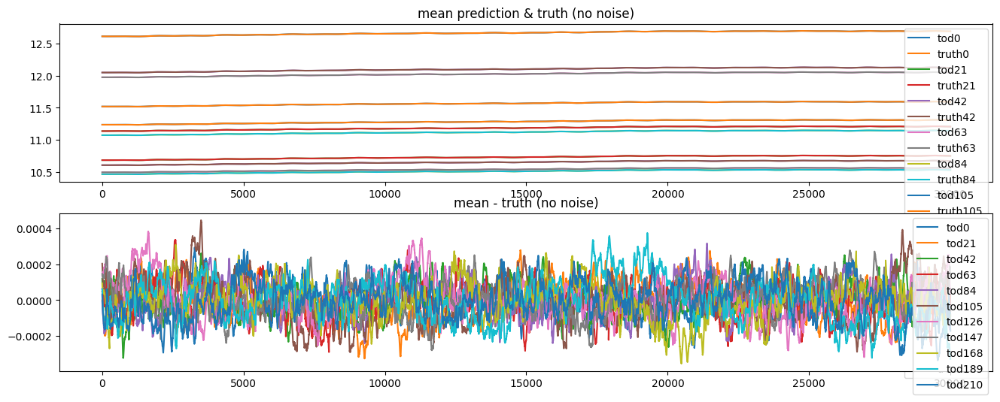

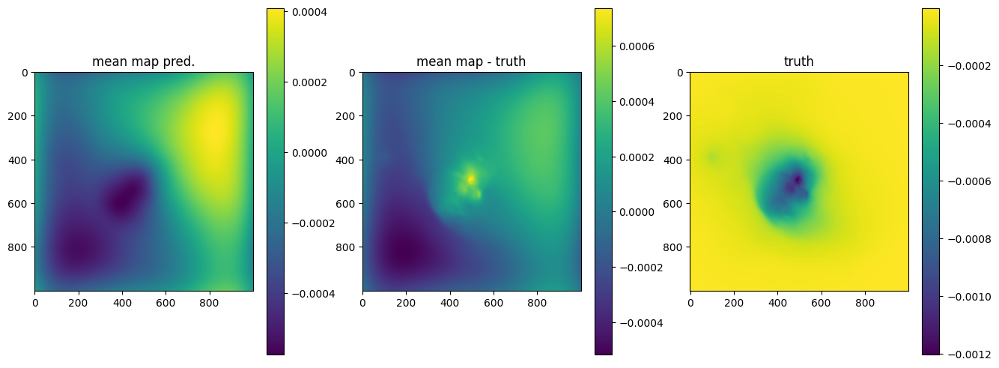

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+2.2833e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+1.1716e+08 Δ⛰:2.1662e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+5.4021e+07 Δ⛰:6.3143e+07 ➽:9.6800e+01
SL: Iteration 3 ⛰:+3.7046e+07 Δ⛰:1.6976e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+6.5069e+06 Δ⛰:3.0539e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+3.0621e+06 Δ⛰:3.4449e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+2.6025e+06 Δ⛰:4.5960e+05 ➽:9.6800e+01
SL: Iteration 7 ⛰:+5.4364e+05 Δ⛰:2.0588e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+2.4102e+05 Δ⛰:3.0262e+05 ➽:9.6800e+01
SL: Iteration 9 ⛰:-9.2793e+05 Δ⛰:1.1690e+06 ➽:9.6800e+01
SL: Iteration 10 ⛰:-9.2816e+05 Δ⛰:2.3017e+02 ➽:9.6800e+01
SL: Iteration 11 ⛰:-9.3222e+05 Δ⛰:4.0595e+03 ➽:9.6800e+01
SL: Iteration 12 ⛰:-2.4290e+06 Δ⛰:1.4968e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-2.7334e+06 Δ⛰:3.0437e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-3.0556e+06 Δ⛰:3.2228e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-3.1463e+06 Δ⛰:9.0649e+04 ➽:9.6800e+01
SL: Iteration 16 ⛰:-3.1468e+06 Δ⛰:4.9809e+02 ➽:9.6800e+01
SL: 

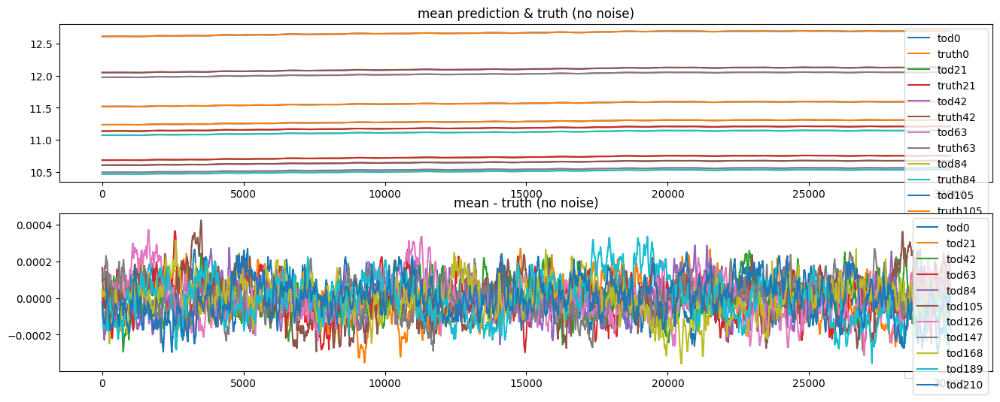

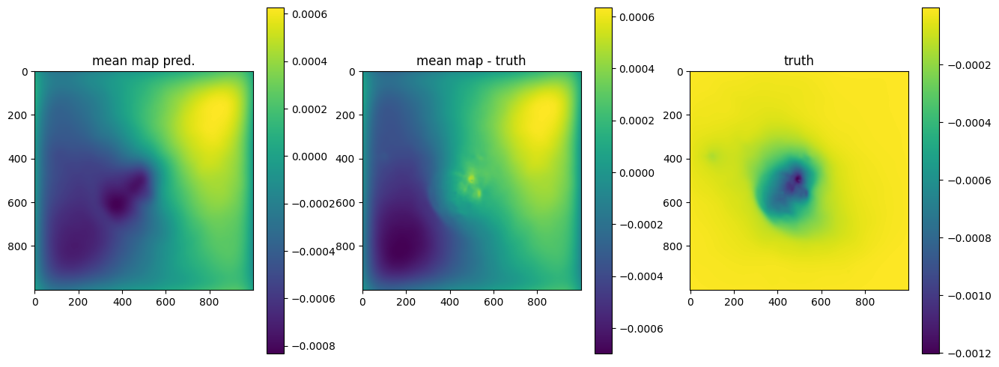

OPTIMIZE_KL: Starting 0031
SL: Iteration 0 ⛰:+7.6536e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+5.6540e+07 Δ⛰:7.5970e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+4.0321e+07 Δ⛰:1.6219e+07 ➽:9.6800e+01
SL: Iteration 3 ⛰:+3.8889e+07 Δ⛰:1.4326e+06 ➽:9.6800e+01
SL: Iteration 4 ⛰:+8.9728e+06 Δ⛰:2.9916e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+6.6459e+06 Δ⛰:2.3270e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+6.6454e+06 Δ⛰:4.3259e+02 ➽:9.6800e+01
SL: Iteration 7 ⛰:+2.4193e+06 Δ⛰:4.2262e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:-3.1005e+05 Δ⛰:2.7293e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:-3.7621e+05 Δ⛰:6.6156e+04 ➽:9.6800e+01
SL: Iteration 10 ⛰:-4.2926e+05 Δ⛰:5.3051e+04 ➽:9.6800e+01
SL: Iteration 11 ⛰:-5.5529e+05 Δ⛰:1.2603e+05 ➽:9.6800e+01
SL: Iteration 12 ⛰:-2.1400e+06 Δ⛰:1.5847e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-2.4791e+06 Δ⛰:3.3909e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-3.0248e+06 Δ⛰:5.4570e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-3.0480e+06 Δ⛰:2.3206e+04 ➽:9.6800e+01
SL: Iteration 16 ⛰:-3.0481e+06 Δ⛰:4.9380e+01 ➽:9.6800e+01
SL: 

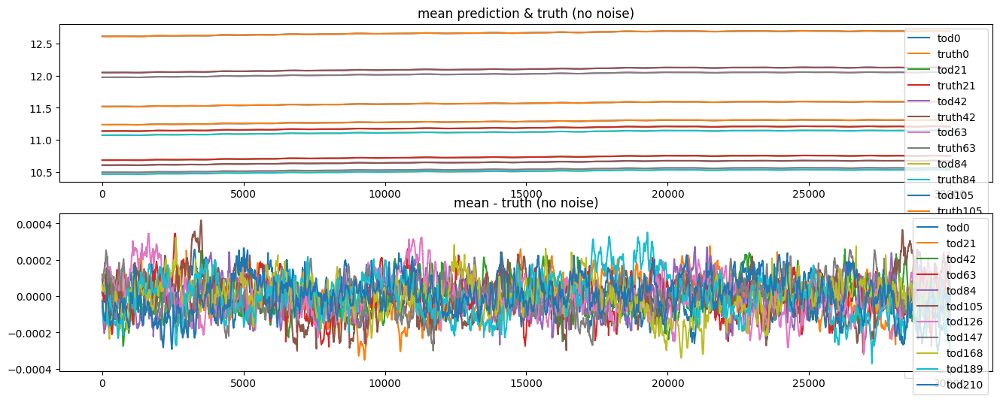

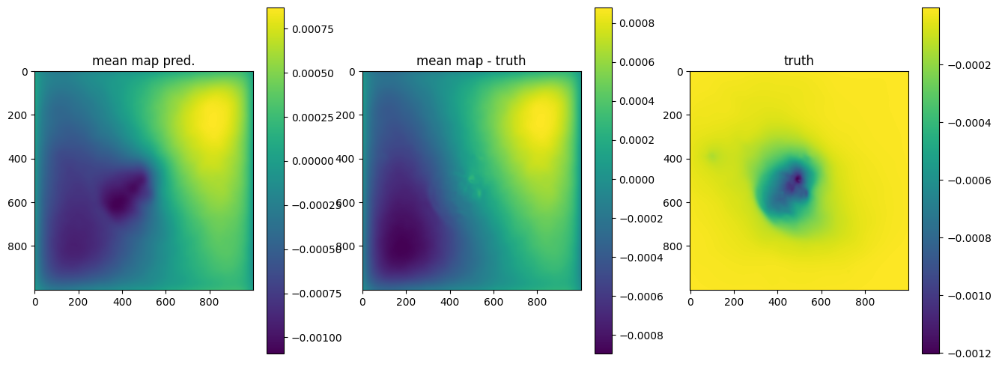

OPTIMIZE_KL: Starting 0041
SL: Iteration 0 ⛰:+2.1662e+08 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+8.7313e+07 Δ⛰:1.2931e+08 ➽:9.6800e+01
SL: Iteration 2 ⛰:+6.3554e+07 Δ⛰:2.3759e+07 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.4264e+07 Δ⛰:9.2894e+06 ➽:9.6800e+01
SL: Iteration 4 ⛰:+1.2411e+07 Δ⛰:4.1854e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+1.0315e+07 Δ⛰:2.0957e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+1.0315e+07 Δ⛰:2.5461e+02 ➽:9.6800e+01
SL: Iteration 7 ⛰:+4.6461e+06 Δ⛰:5.6686e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+5.7788e+05 Δ⛰:4.0683e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+5.6356e+05 Δ⛰:1.4320e+04 ➽:9.6800e+01
SL: Iteration 10 ⛰:+3.7531e+05 Δ⛰:1.8825e+05 ➽:9.6800e+01
SL: Iteration 11 ⛰:+3.4398e+05 Δ⛰:3.1335e+04 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.6549e+06 Δ⛰:1.9989e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-1.9674e+06 Δ⛰:3.1256e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.6933e+06 Δ⛰:7.2585e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.6934e+06 Δ⛰:9.6074e+01 ➽:9.6800e+01
SL: Iteration 0 ⛰:+3.6769e+10 Δ⛰:inf ➽:9.6800e+01
SL: Iteratio

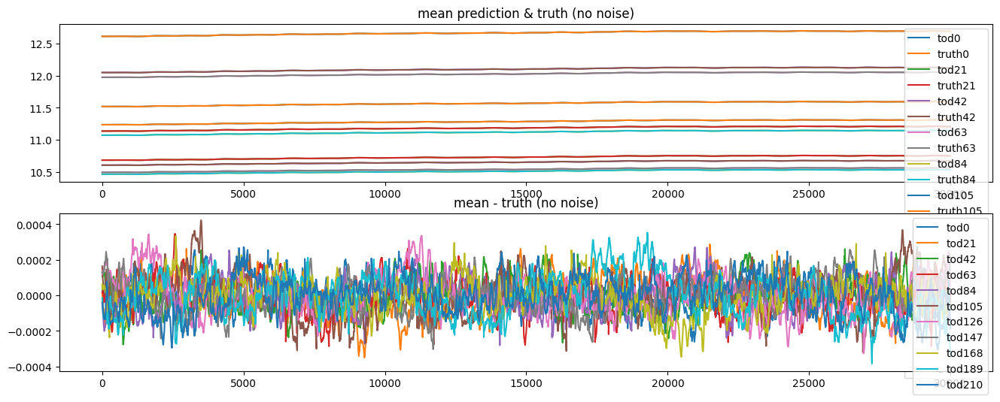

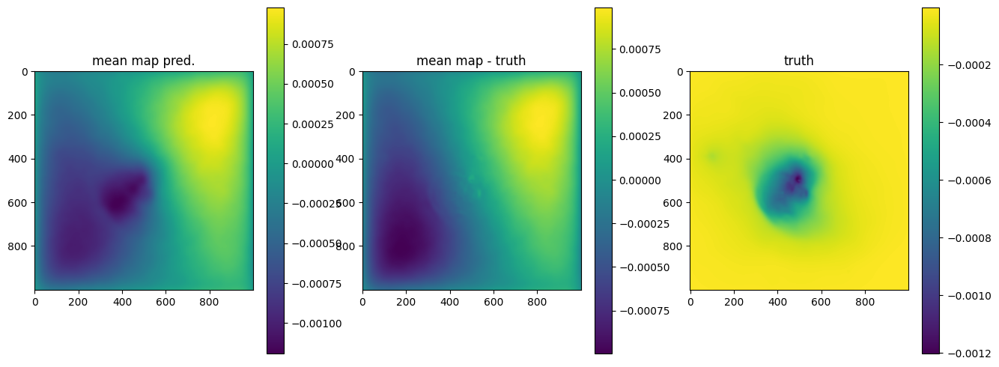

OPTIMIZE_KL: Starting 0051
SL: Iteration 0 ⛰:+7.5038e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+2.2124e+08 Δ⛰:7.2825e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+1.0042e+08 Δ⛰:1.2082e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.0630e+07 Δ⛰:4.9791e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+2.6443e+07 Δ⛰:2.4187e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+9.5210e+06 Δ⛰:1.6922e+07 ➽:9.6800e+01
SL: Iteration 6 ⛰:+9.5204e+06 Δ⛰:6.2013e+02 ➽:9.6800e+01
SL: Iteration 7 ⛰:+4.0135e+06 Δ⛰:5.5069e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+2.9754e+05 Δ⛰:3.7159e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+2.8788e+05 Δ⛰:9.6649e+03 ➽:9.6800e+01
SL: Iteration 10 ⛰:+2.3891e+05 Δ⛰:4.8968e+04 ➽:9.6800e+01
SL: Iteration 11 ⛰:+2.2511e+05 Δ⛰:1.3795e+04 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.6710e+06 Δ⛰:1.8961e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-1.9591e+06 Δ⛰:2.8817e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.7915e+06 Δ⛰:8.3238e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.7915e+06 Δ⛰:2.6188e+00 ➽:9.6800e+01
SL: Iteration 0 ⛰:+1.2123e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteratio

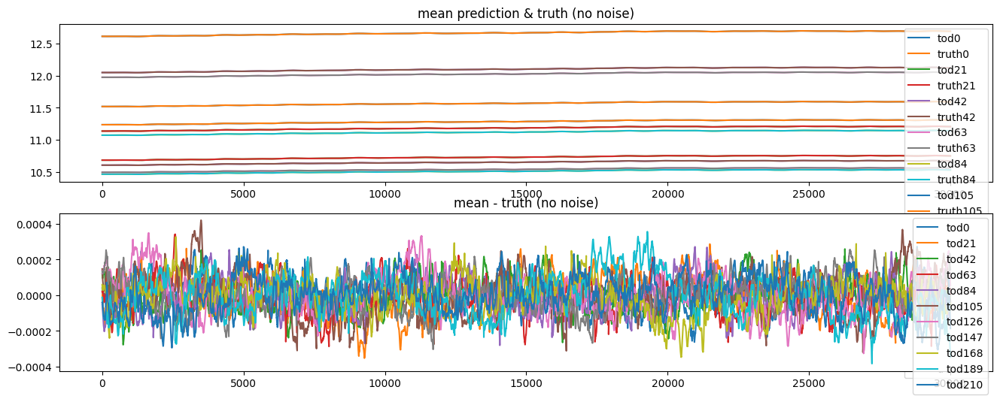

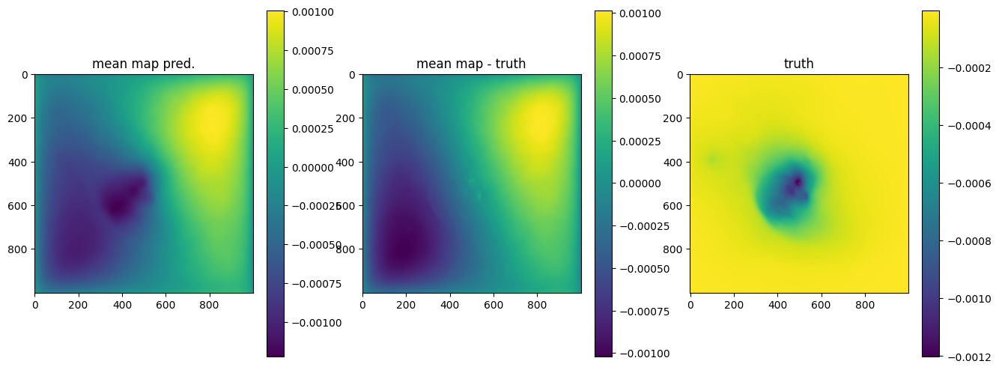

OPTIMIZE_KL: Starting 0061
SL: Iteration 0 ⛰:+1.3963e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+5.5361e+08 Δ⛰:8.4271e+08 ➽:9.6800e+01
SL: Iteration 2 ⛰:+1.1769e+08 Δ⛰:4.3592e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.2508e+07 Δ⛰:6.5184e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+3.1746e+07 Δ⛰:2.0763e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+9.9964e+06 Δ⛰:2.1749e+07 ➽:9.6800e+01
SL: Iteration 6 ⛰:+9.9952e+06 Δ⛰:1.1912e+03 ➽:9.6800e+01
SL: Iteration 7 ⛰:+4.0850e+06 Δ⛰:5.9103e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+9.3740e+05 Δ⛰:3.1476e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+1.8964e+05 Δ⛰:7.4776e+05 ➽:9.6800e+01
SL: Iteration 10 ⛰:-1.8540e+06 Δ⛰:2.0436e+06 ➽:9.6800e+01
SL: Iteration 11 ⛰:-1.8569e+06 Δ⛰:2.9574e+03 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.8580e+06 Δ⛰:1.0688e+03 ➽:9.6800e+01
SL: Iteration 13 ⛰:-2.1168e+06 Δ⛰:2.5882e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.6317e+06 Δ⛰:5.1488e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.6321e+06 Δ⛰:3.9501e+02 ➽:9.6800e+01
SL: Iteration 16 ⛰:-2.6321e+06 Δ⛰:5.3337e+01 ➽:9.6800e+01
SL: 

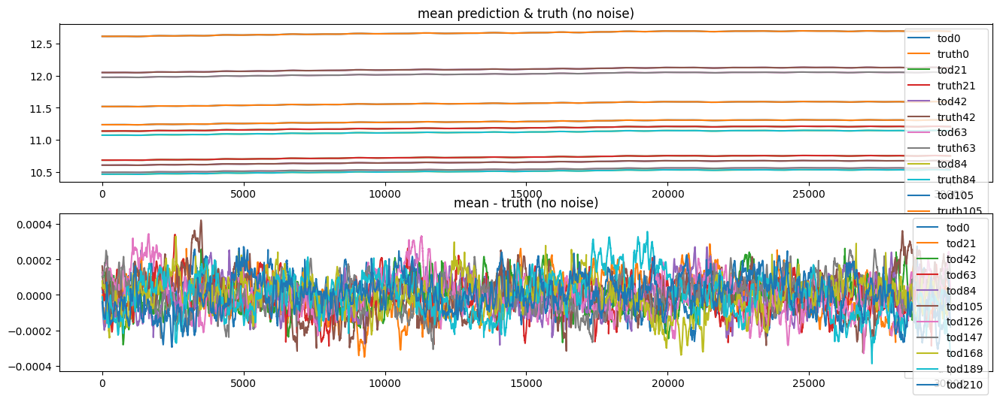

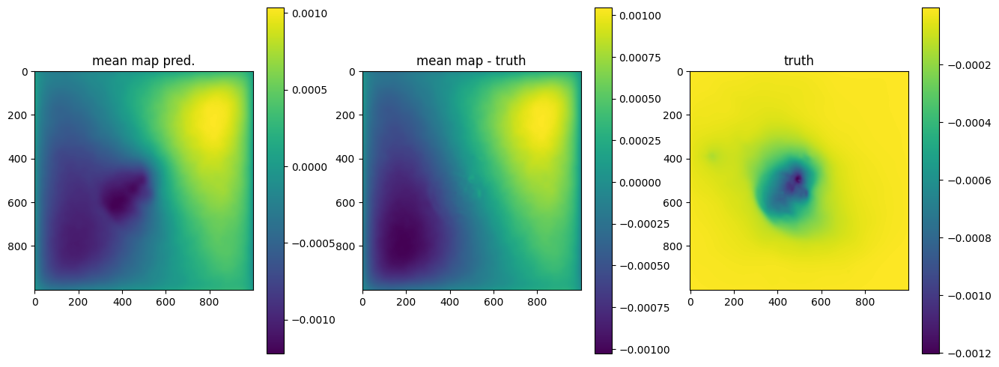

OPTIMIZE_KL: Starting 0071
SL: Iteration 0 ⛰:+2.8398e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+3.1848e+08 Δ⛰:2.5213e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+6.8829e+07 Δ⛰:2.4965e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+5.4391e+07 Δ⛰:1.4439e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+1.0842e+07 Δ⛰:4.3549e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+9.5819e+06 Δ⛰:1.2601e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+9.5322e+06 Δ⛰:4.9659e+04 ➽:9.6800e+01
SL: Iteration 7 ⛰:+4.1946e+06 Δ⛰:5.3376e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+2.2545e+05 Δ⛰:3.9691e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+2.0722e+05 Δ⛰:1.8237e+04 ➽:9.6800e+01
SL: Iteration 10 ⛰:+4.5804e+04 Δ⛰:1.6141e+05 ➽:9.6800e+01
SL: Iteration 11 ⛰:-1.7405e+05 Δ⛰:2.1985e+05 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.8368e+06 Δ⛰:1.6627e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-2.1487e+06 Δ⛰:3.1190e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.8855e+06 Δ⛰:7.3681e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.8858e+06 Δ⛰:3.1865e+02 ➽:9.6800e+01
SL: Iteration 16 ⛰:-2.9070e+06 Δ⛰:2.1183e+04 ➽:9.6800e+01
SL: 

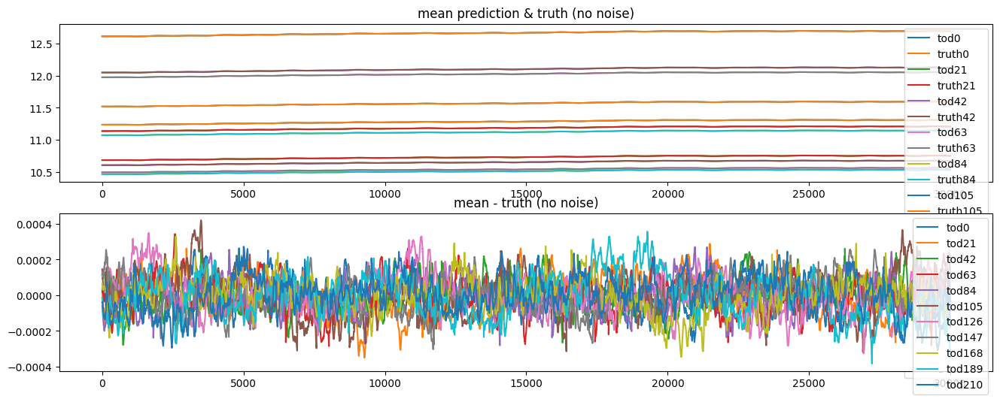

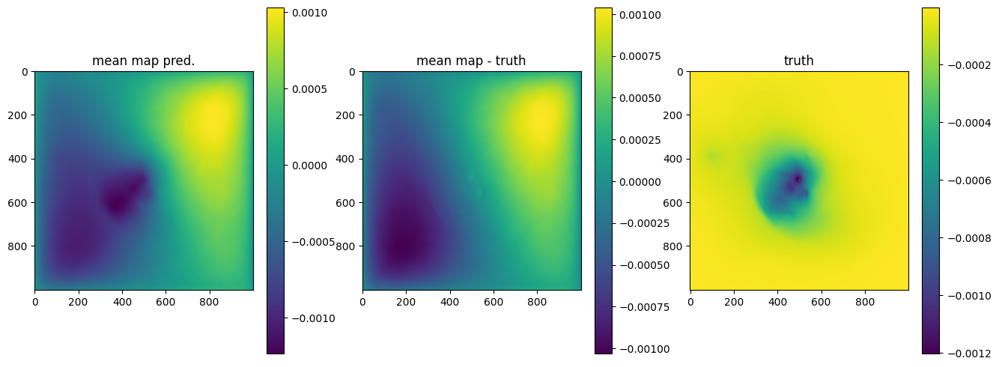

OPTIMIZE_KL: Starting 0081
SL: Iteration 0 ⛰:+1.8337e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+5.7145e+08 Δ⛰:1.2623e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+1.1648e+08 Δ⛰:4.5496e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+4.9509e+07 Δ⛰:6.6975e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+1.1904e+07 Δ⛰:3.7605e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+1.0331e+07 Δ⛰:1.5736e+06 ➽:9.6800e+01
SL: Iteration 6 ⛰:+1.0327e+07 Δ⛰:3.9245e+03 ➽:9.6800e+01
SL: Iteration 7 ⛰:+4.2774e+06 Δ⛰:6.0492e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+7.5974e+05 Δ⛰:3.5177e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+4.8395e+05 Δ⛰:2.7579e+05 ➽:9.6800e+01
SL: Iteration 10 ⛰:-3.7466e+05 Δ⛰:8.5861e+05 ➽:9.6800e+01
SL: Iteration 11 ⛰:-6.2035e+05 Δ⛰:2.4569e+05 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.7363e+06 Δ⛰:1.1160e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-2.1160e+06 Δ⛰:3.7968e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.7296e+06 Δ⛰:6.1358e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.7296e+06 Δ⛰:1.4773e+01 ➽:9.6800e+01
SL: Iteration 0 ⛰:+4.3473e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteratio

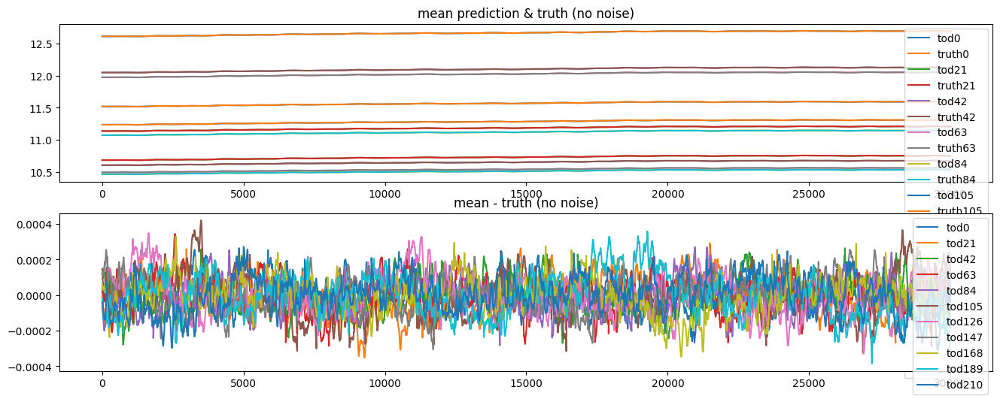

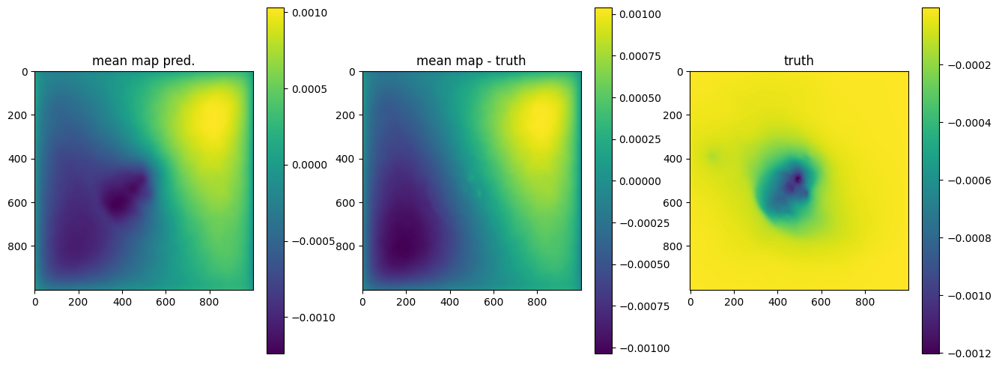

OPTIMIZE_KL: Starting 0091
SL: Iteration 0 ⛰:+5.6897e+09 Δ⛰:inf ➽:9.6800e+01
SL: Iteration 1 ⛰:+2.5518e+08 Δ⛰:5.4345e+09 ➽:9.6800e+01
SL: Iteration 2 ⛰:+8.3215e+07 Δ⛰:1.7197e+08 ➽:9.6800e+01
SL: Iteration 3 ⛰:+4.9054e+07 Δ⛰:3.4161e+07 ➽:9.6800e+01
SL: Iteration 4 ⛰:+2.3867e+07 Δ⛰:2.5187e+07 ➽:9.6800e+01
SL: Iteration 5 ⛰:+9.6453e+06 Δ⛰:1.4222e+07 ➽:9.6800e+01
SL: Iteration 6 ⛰:+9.6448e+06 Δ⛰:4.8679e+02 ➽:9.6800e+01
SL: Iteration 7 ⛰:+3.9641e+06 Δ⛰:5.6807e+06 ➽:9.6800e+01
SL: Iteration 8 ⛰:+3.0479e+05 Δ⛰:3.6594e+06 ➽:9.6800e+01
SL: Iteration 9 ⛰:+2.9808e+05 Δ⛰:6.7065e+03 ➽:9.6800e+01
SL: Iteration 10 ⛰:+1.3835e+05 Δ⛰:1.5973e+05 ➽:9.6800e+01
SL: Iteration 11 ⛰:+1.6799e+04 Δ⛰:1.2156e+05 ➽:9.6800e+01
SL: Iteration 12 ⛰:-1.7142e+06 Δ⛰:1.7310e+06 ➽:9.6800e+01
SL: Iteration 13 ⛰:-1.9515e+06 Δ⛰:2.3733e+05 ➽:9.6800e+01
SL: Iteration 14 ⛰:-2.4893e+06 Δ⛰:5.3771e+05 ➽:9.6800e+01
SL: Iteration 15 ⛰:-2.4911e+06 Δ⛰:1.8012e+03 ➽:9.6800e+01
SL: Iteration 16 ⛰:-2.8224e+06 Δ⛰:3.3139e+05 ➽:9.6800e+01
SL: 

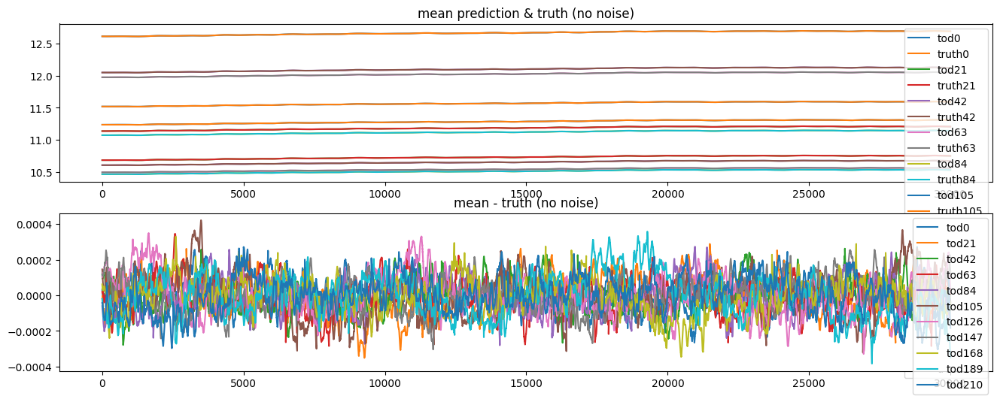

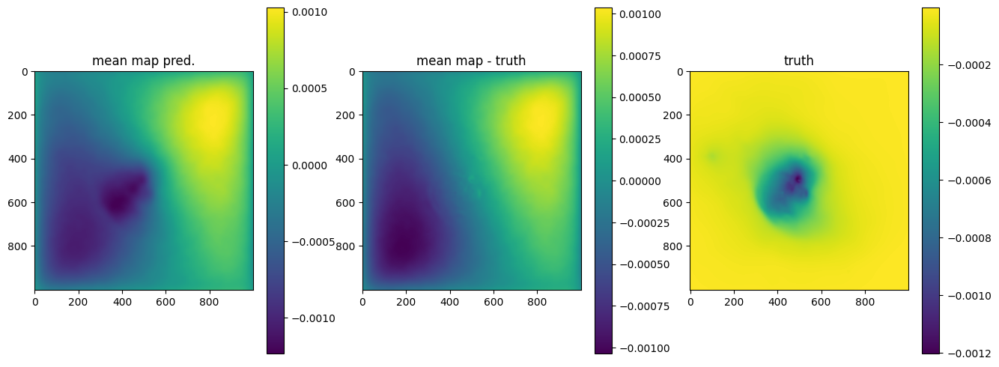

In [30]:
# n_it = 20
# n_it = 50
# n_it = 250
n_it = 100

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    iter = opt_state[0]
    printevery = 10
    if iter % printevery != 0: return

    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    # for i in range(n):
    for i in range(0, n, n//10):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")
        # axes_tods[0].plot(denoised_jax_tod[i, 100:-100], label=f"truth{i}")
        # axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i, 100:-100], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))
    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=20),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [31]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.001016621814697268, 0.002, 0.001
	loglogvarslope: -2.16409798104696, -2.5, 0.5
	zeromode std (LogNormal): 0.00022787513731149076, 0.0002, 0.0001
map:
	fluctuations: 3.472801891839305e-05, 4.5e-05, 2e-05
	loglogvarslope: -2.821231049192988, -2.5, 0.5
	zeromode std (LogNormal): 9.711234733010094e-10, 1e-08, 1e-07


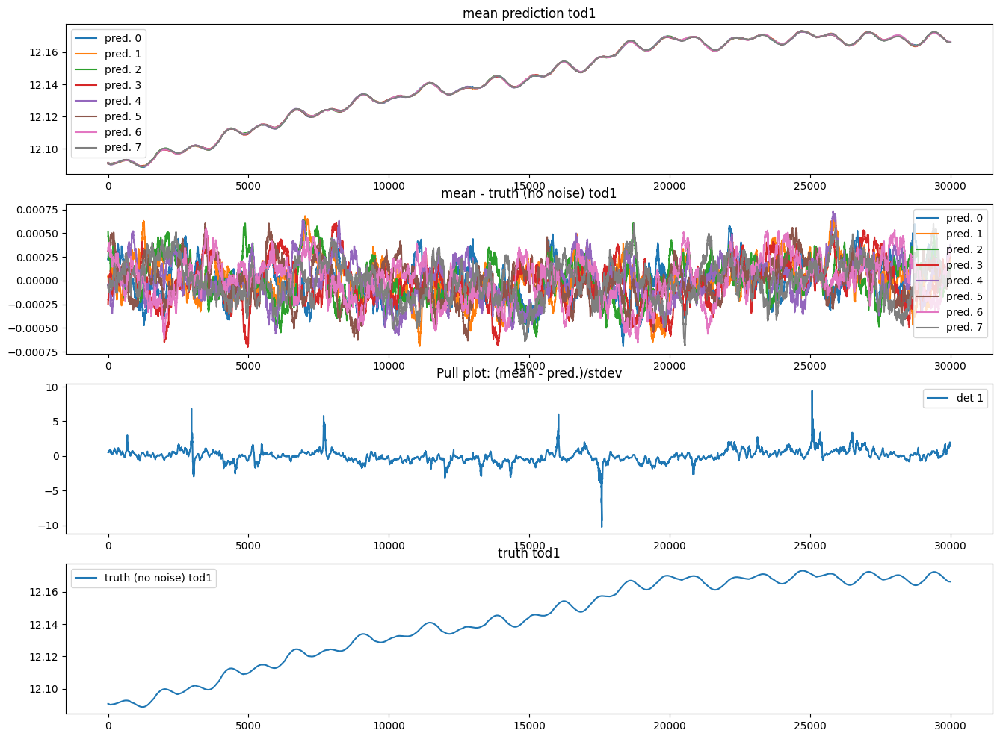

In [32]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

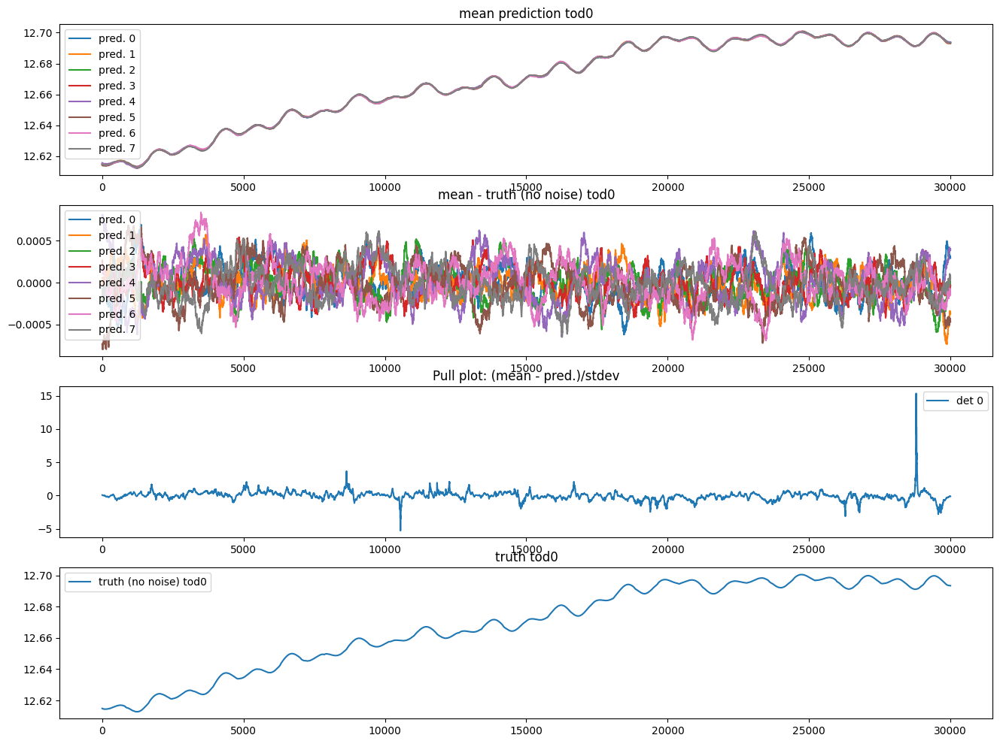

In [33]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    # im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i, 100:-100], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
# im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i, 100:-100])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [34]:
from maria.map.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_preprocessing={
                        "window": {"tukey": {"alpha": 0.1}},
                        "remove_modes": {"n": 1},
                        "filter": {"f_lower": 0.01},
                        "despline": {"knot_spacing": 5},
                                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                                    },
                   units="K_RJ",
                   tods=[tod_truthmap],
                   )

output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.05s/it]


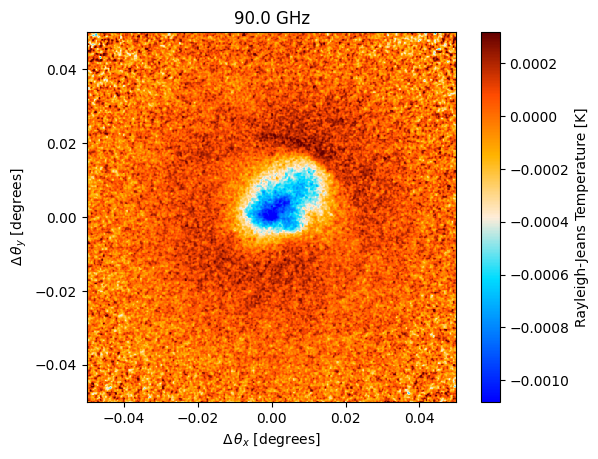

In [35]:
output_map.plot()

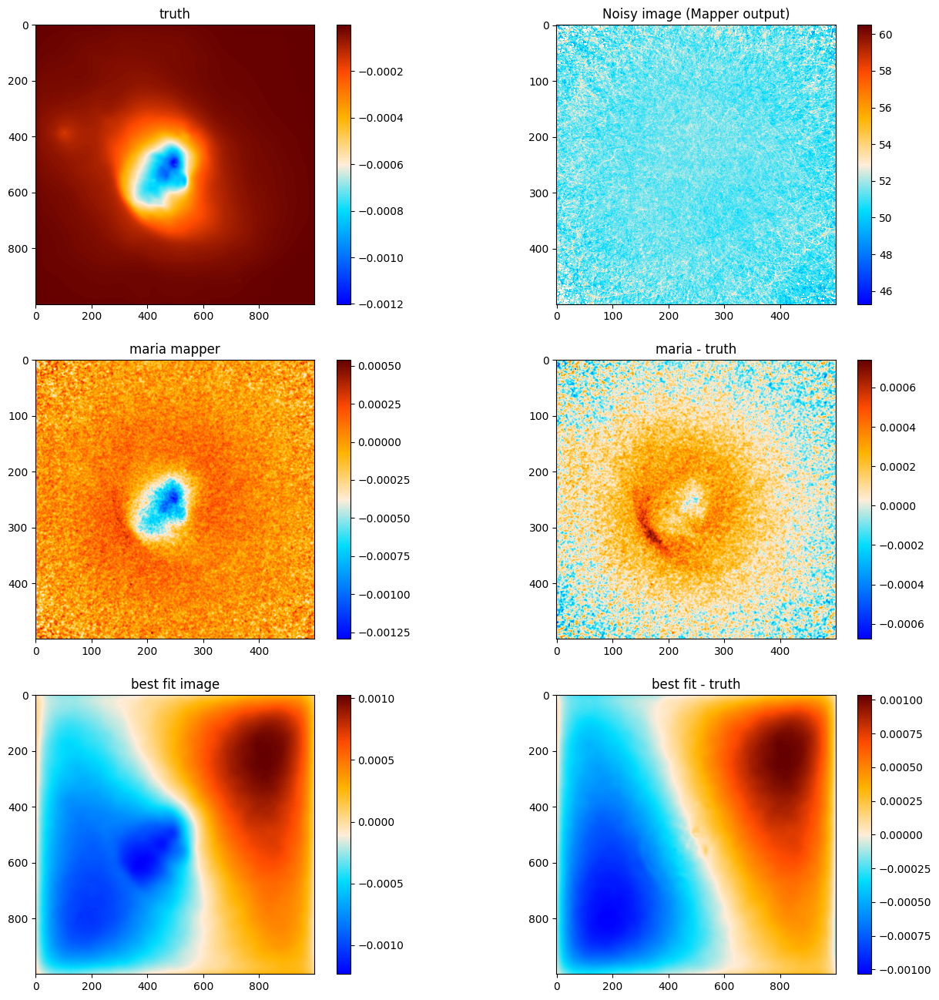

In [36]:
from skimage.transform import resize

# Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
sig_map = gp_map(samples.pos)
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(output_truthmap.data[0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow(output_map.data[0], cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow((output_map.data[0] - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()